In [1]:
import warnings; warnings.filterwarnings("ignore")
import local; from models.preprocessing import utils
import mne; mne.utils.set_log_level('error')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from functools import reduce

In [6]:
d = "../../data/reinhartlab/multimodal/cg/Spectral Power/Binned/"
ext = ".binned.2to100-tfr.h5"
box=utils.select_dataset(d,ext);box

In [7]:
stim_files = [d+f+ext for f in utils.get_selection(box) if "stimulus" in f]
resp_files = [d+f+ext for f in utils.get_selection(box) if "response" in f]
fdbk_files = [d+f+ext for f in utils.get_selection(box) if "feedback" in f]

In [8]:
stim_tfrs = [mne.time_frequency.read_tfrs(f)[0] for f in stim_files]
resp_tfrs = [mne.time_frequency.read_tfrs(f)[0] for f in resp_files]
fdbk_tfrs = [mne.time_frequency.read_tfrs(f)[0] for f in fdbk_files]

In [10]:
s_vc=np.vstack([tfrs["BlockType in ['visual/right','visual/left'] & FeedbackType == 'positive'"].data for tfrs in stim_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
s_vf=np.vstack([tfrs["BlockType in ['visual/right','visual/left'] & FeedbackType == 'negative'"].data for tfrs in stim_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
s_ac=np.vstack([tfrs["BlockType in ['auditive/right','auditive/left'] & FeedbackType == 'positive'"].data for tfrs in stim_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
s_af=np.vstack([tfrs["BlockType in ['auditive/right','auditive/left'] & FeedbackType == 'negative'"].data for tfrs in stim_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
r_vc=np.vstack([tfrs["BlockType in ['visual/right','visual/left'] & FeedbackType == 'positive'"].data for tfrs in resp_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
r_vf=np.vstack([tfrs["BlockType in ['visual/right','visual/left'] & FeedbackType == 'negative'"].data for tfrs in resp_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
r_ac=np.vstack([tfrs["BlockType in ['auditive/right','auditive/left'] & FeedbackType == 'positive'"].data for tfrs in resp_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
r_af=np.vstack([tfrs["BlockType in ['auditive/right','auditive/left'] & FeedbackType == 'negative'"].data for tfrs in resp_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
f_vc=np.vstack([tfrs["BlockType in ['visual/right','visual/left'] & FeedbackType == 'positive'"].data for tfrs in fdbk_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
f_vf=np.vstack([tfrs["BlockType in ['visual/right','visual/left'] & FeedbackType == 'negative'"].data for tfrs in fdbk_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
f_ac=np.vstack([tfrs["BlockType in ['auditive/right','auditive/left'] & FeedbackType == 'positive'"].data for tfrs in fdbk_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])
f_af=np.vstack([tfrs["BlockType in ['auditive/right','auditive/left'] & FeedbackType == 'negative'"].data for tfrs in fdbk_tfrs if len(tfrs)>0 and len(tfrs.ch_names) is 60])

In [91]:
def plot_topomap(conds,info,tband,fband,alpha=.05,ax=None):
    T,c,p,_ = mne.stats.permutation_cluster_test([np.mean(conds[0][:,:,fband,:][:,:,:,tband],axis=(2,3)),np.mean(conds[1][:,:,fband,:][:,:,:,tband],axis=(2,3))])
    m = np.ones((60,1))>1
    for s,t in zip(c,p):
        if t<alpha:
            m[s]=True
    mne.viz.plot_topomap(T,stim_tfrs[0].info,mask=np.squeeze(m),cmap='Spectral_r',axes=ax,show=False);

In [129]:
def plot_topo_time_series(data,tfr,freqs,times,alpha=.01,title=""):
    fig,axs = plt.subplots(1,len(times),figsize=(5*len(times),5))
    fs = tfr.freqs
    ts = tfr.times
    tt = ["t={} to {}s".format(t[0],t[1]) for t in times]
    fband = np.logical_and(fs>=freqs[0],fs<=freqs[1])
    for i,ax in enumerate(axs):
        tband = np.logical_and(ts>=times[i][0],ts<times[i][1])
        plot_topomap(data,tfr.info,tband,fband,.01,ax=ax);
        ax.set_xlabel(tt[i])
    fig.suptitle(title)

### Stimulus-locked, correct vs incorrect responses to visual stimuli

We observe for
* Delta band:
        - Early (0-200ms) difference in large frontal area
        - Late (1300-1900ms) difference in central / temporal-right area
* Alpha band:
        - Delayed (1100-1300ms) difference in frontal area
        - Late (1600- ms) difference in occipital to central area
* Low beta band:
        - Initial (0-100ms) frontal difference (Ignore?)
        - Early (300-700ms) occipital to left frontal difference 
        - Late (1600- ms) occipital to central difference 

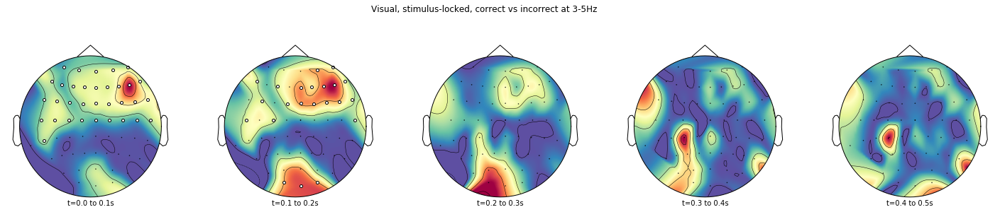

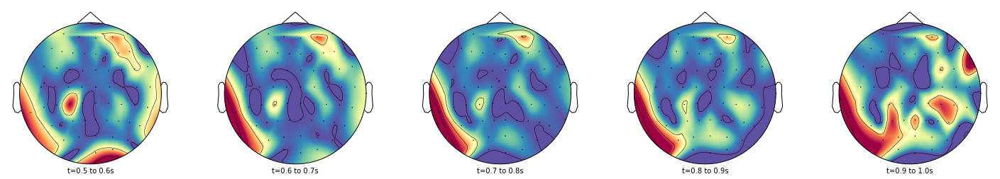

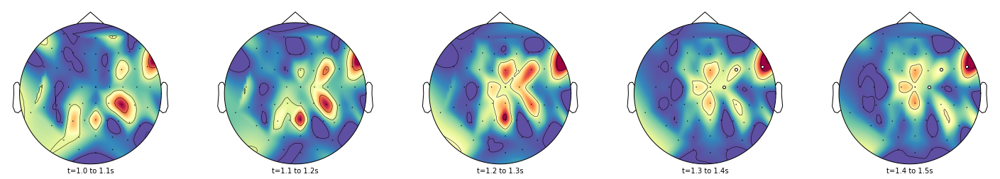

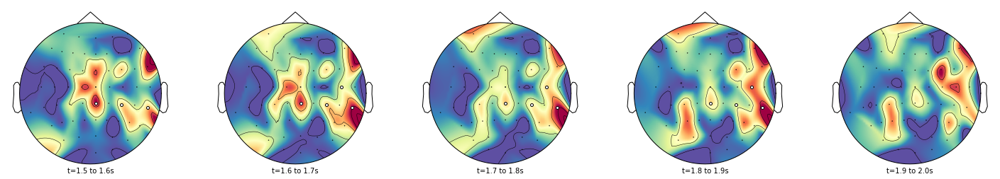

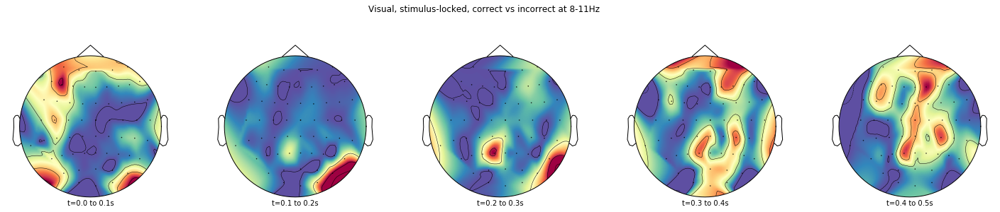

...

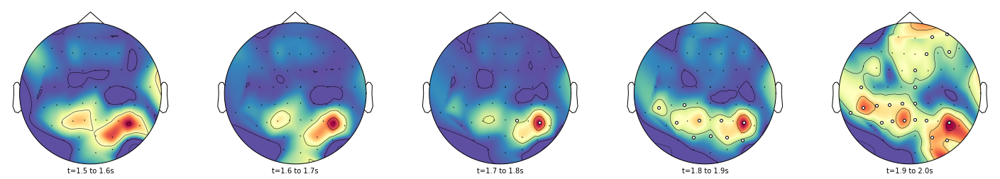

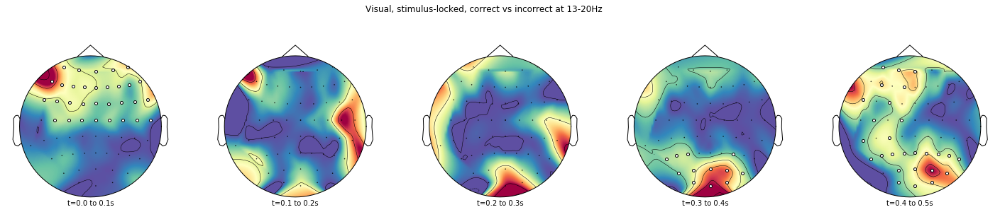

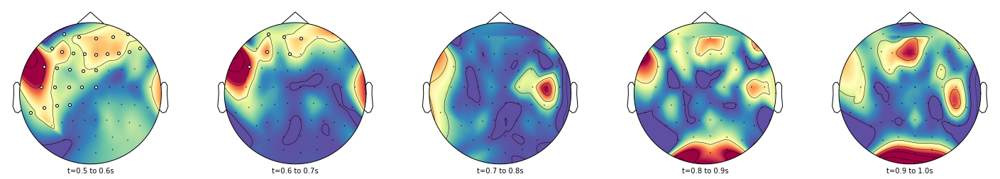

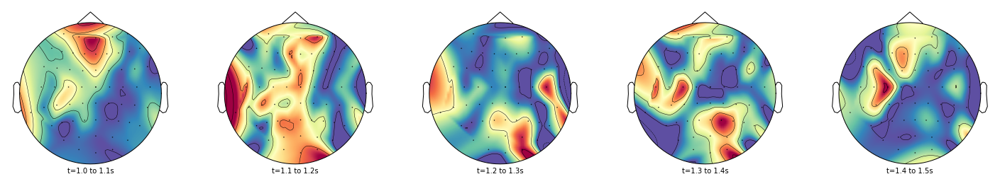

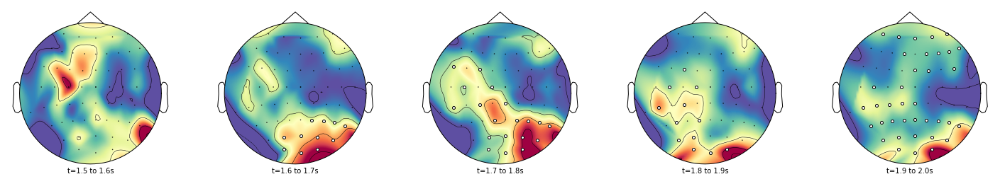

In [138]:
ts = np.round(np.array(range(20))/10,1)
ts = [z for z in zip(ts,np.round(ts+.1,1))]
tfr = stim_tfrs[0]
lock='stimulus'
conds = [s_vc,s_vf]
for fb in [(3,5),(8,11),(13,20)]:
    plot_topo_time_series(conds,tfr,fb,ts[:5],.05,"Visual, {}-locked, correct vs incorrect at {}-{}Hz".format(lock,fb[0],fb[1]))
    plot_topo_time_series(conds,tfr,fb,ts[5:10],.05,"")
    plot_topo_time_series(conds,tfr,fb,ts[10:15],.05,"")
    plot_topo_time_series(conds,tfr,fb,ts[15:],.05,"")

### Response-locked, correct vs incorrect responses to visual stimuli
We observe for
* Delta band:
        - Early pre-response (-1000 - -500ms) difference in frontal area
        - Enduring post-response (0-1000+ms) difference in global and frontal area
* Theta band:
        - Early pre-response (-900 - -600ms) difference in occipital and frontal areas
        - Initial post-response (0-300ms) difference in large frontal area
        - Delayed post-response (400-1000+ms) difference in central, frontal and global area
* Alpha band:
        - Post-response (200-1000+ms) difference in right parietal area
* Betas bands (low & high):
        - Initial post-response (0-100ms) difference in frontal area
        - Short, recurrent post-response (200-300, 500-700, 900-1000ms) differences in central/occipital areas
* Low Gamma band:
        - Early to intermediate post-response (200-400,600-700ms) difference in occipital area
* High Gamma band:
        - Initial global then occipital post-response difference (0-100,100-300ms)

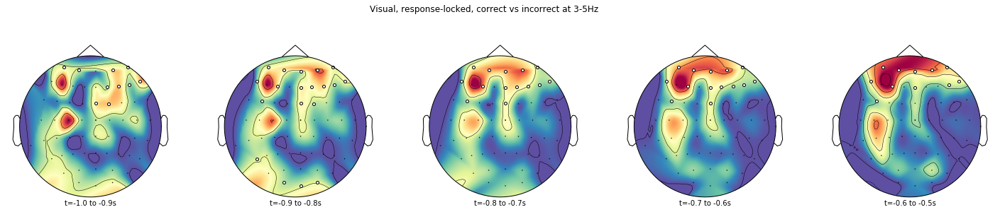

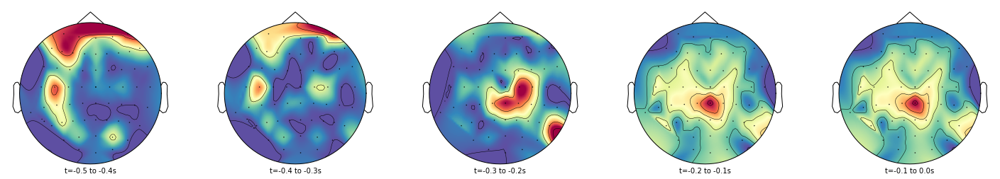

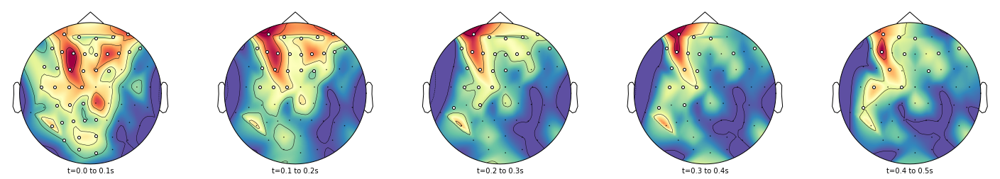

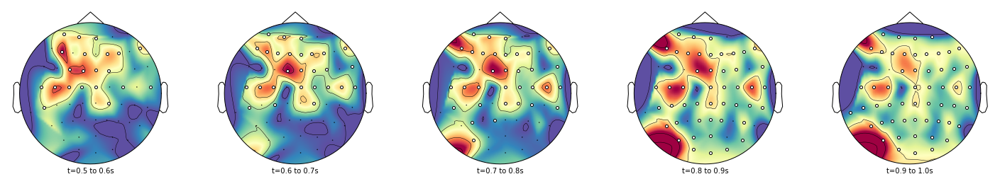

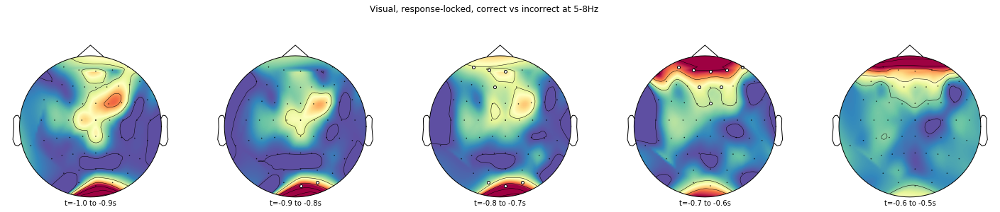

...

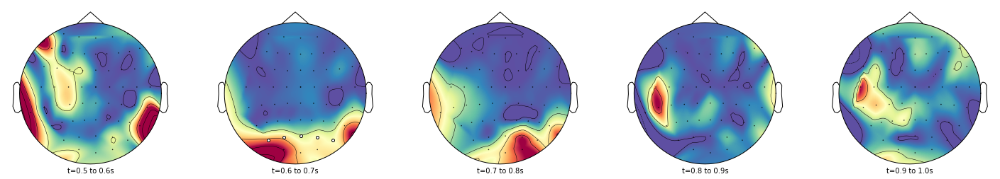

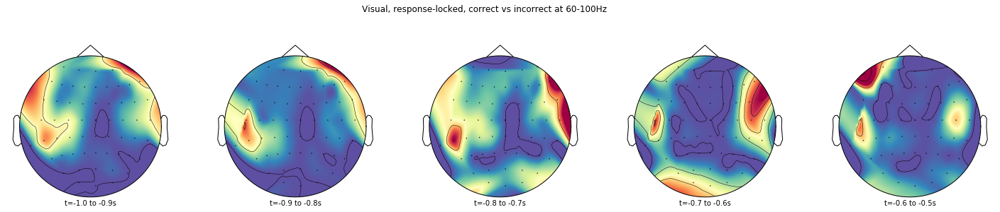

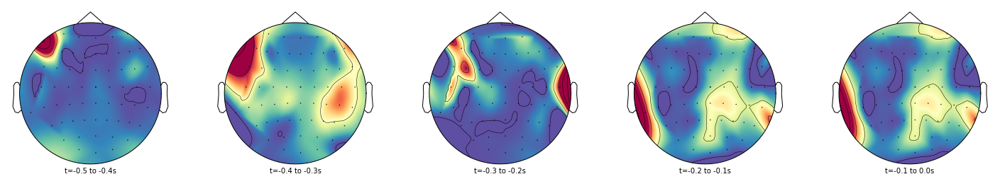

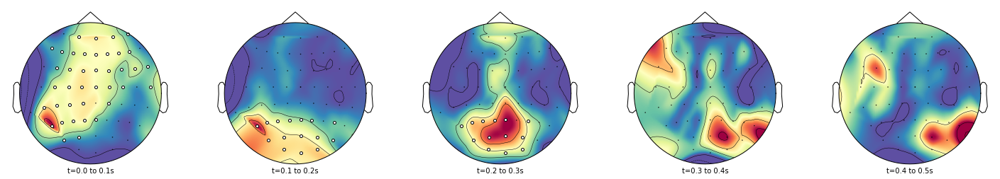

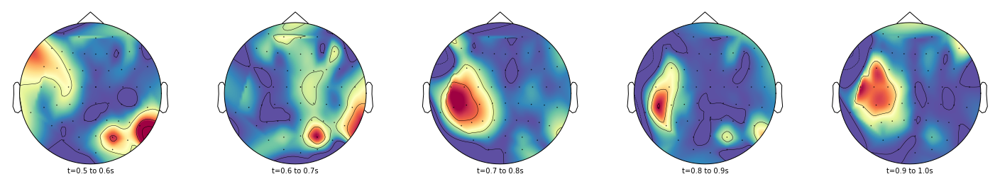

In [139]:
ts = np.round(np.array(range(20))/10-1,1)
ts = [z for z in zip(ts,np.round(ts+.1,1))]
tfr = resp_tfrs[0]
lock='response'
conds = [r_vc,r_vf]
for fb in [(3,5),(5,8),(8,11),(13,20),(20,30),(30,60),(60,100)]:
    plot_topo_time_series(conds,tfr,fb,ts[:5],.05,"Visual, {}-locked, correct vs incorrect at {}-{}Hz".format(lock,fb[0],fb[1]))
    plot_topo_time_series(conds,tfr,fb,ts[5:10],.05,"")
    plot_topo_time_series(conds,tfr,fb,ts[10:15],.05,"")
    plot_topo_time_series(conds,tfr,fb,ts[15:],.05,"")

### Feedback-locked, correct vs incorrect responses to visual stimuli
* Delta band:
        - Fronto-central (200-500ms) to global (500-1100ms) to frontal (1100-1700ms) differences
* Theta band:
        - Initial occipital (0-200ms) difference
        - Early (200-700ms) posterior/central difference
        - Delayed (700-900ms) right hemisphere difference
* Alpha band:
        - Initial (0-200ms) global difference
        - Delayed (400-600ms) right-posterior to global (600-1700ms) difference
* Low Beta band:
        - Late (800-1600ms) global difference
* High Beta band:
        - Late (1100-1400ms) left hemisphere difference
        - Late (1700-1800ms) posterior difference
* Low Gamma band:
        - Late (1300-1400ms) Left fronto-central difference

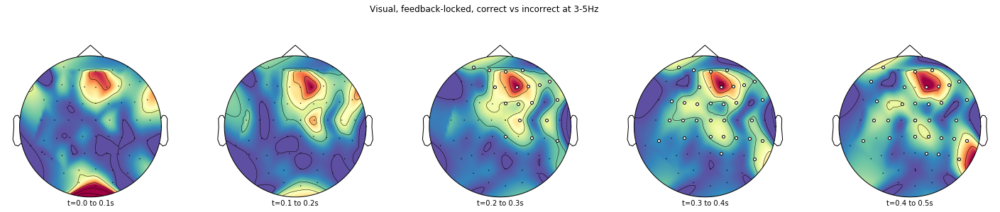

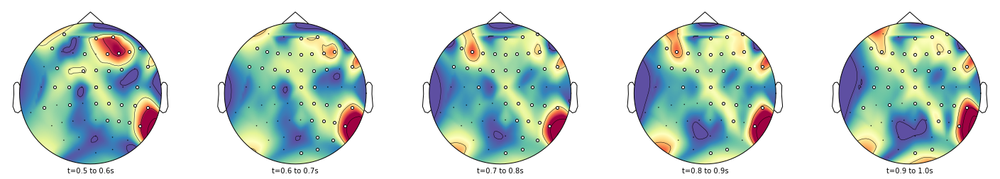

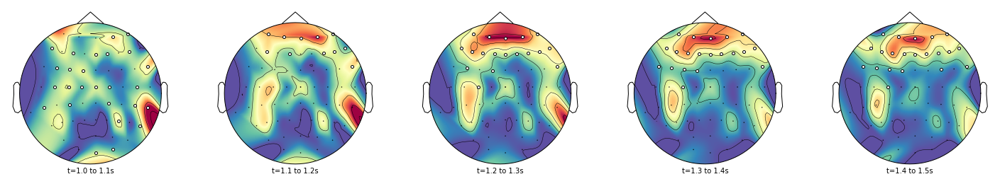

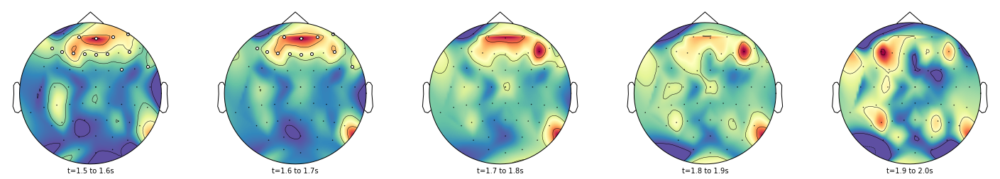

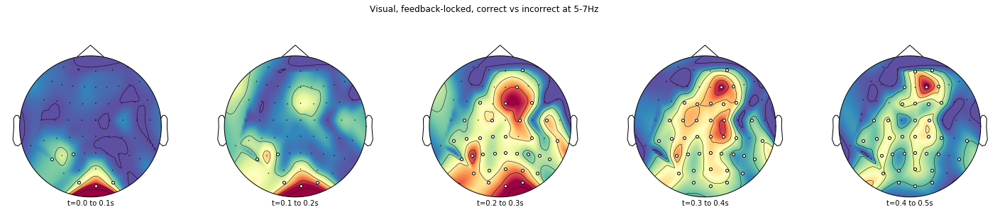

...

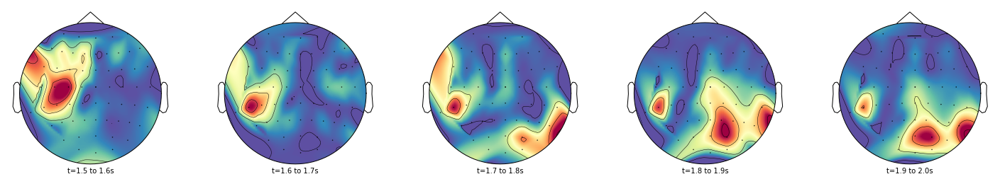

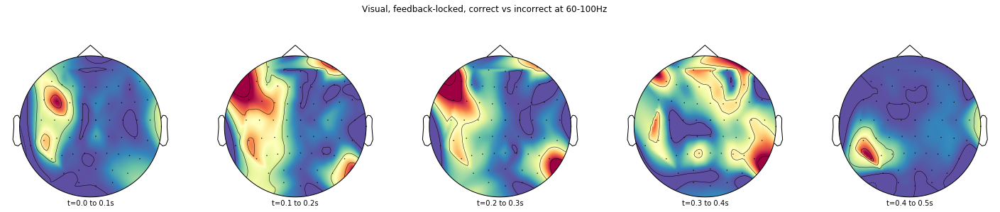

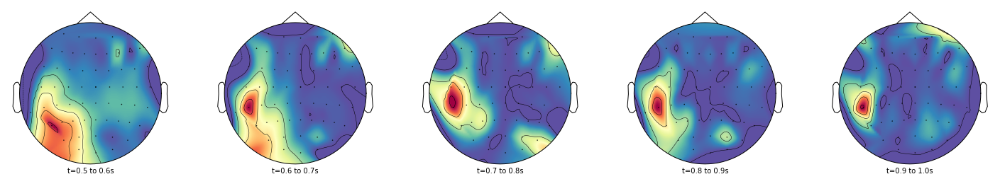

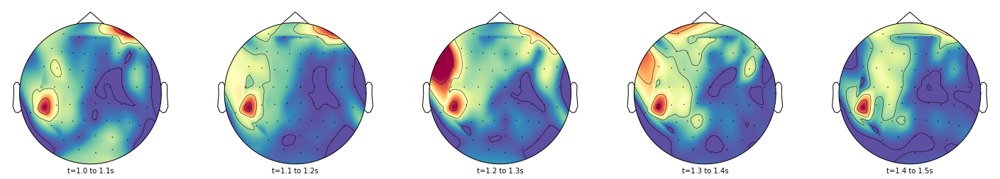

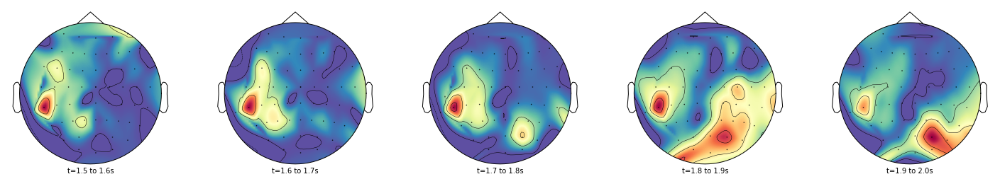

In [141]:
ts = np.round(np.array(range(20))/10,1)
ts = [z for z in zip(ts,np.round(ts+.1,1))]
tfr = fdbk_tfrs[0]
lock='feedback'
conds = [f_vc,f_vf]
for fb in [(3,5),(5,7),(8,11),(13,20),(20,30),(30,60),(60,100)]:
    plot_topo_time_series(conds,tfr,fb,ts[:5],.05,"Visual, {}-locked, correct vs incorrect at {}-{}Hz".format(lock,fb[0],fb[1]))
    plot_topo_time_series(conds,tfr,fb,ts[5:10],.05,"")
    plot_topo_time_series(conds,tfr,fb,ts[10:15],.05,"")
    plot_topo_time_series(conds,tfr,fb,ts[15:],.05,"")